In [1]:
import pickle
import os
import numpy as np
import pandas as pd
import sys

sys.path.append('../')

In [2]:
from userdata_mining.embedding import Embedding

In [ ]:
from userdata_mining.visualization.base import Visualizer
from userdata_mining.utils import warn, error
from math import sqrt
from ivis import Ivis
import matplotlib.pyplot as plt


class EmbeddingVisualizer(Visualizer):
    """
    Visualizes the embeddings of the data along with an optional reference point.
    """

    def __init__(self, embedding_dims=2):
        """
        Initializes the visualizer.

        :param {int} embedding_dims - Dimensions to embed to.
        """
        if embedding_dims < 1:
            error('embedding_dims must be positive')
            exit(3)
        elif not isinstance(embedding_dims, int):
            error('embedding_dims must be an integer')
            exit(3)
        elif embedding_dims > 2:
            error('embedding_dims must be 1 or 2')
            exit(3)

        self.embedding_dims = embedding_dims

    def _reduce_dims(self, arg):
        """
        Uses ivis to reduce dimensionality to 2.

        :param {Iterable} arg - an array-like object
        :return {np.ndarray} embedded object
        """
        m = arg.shape[0]
        if m > 200:
            k = int(0.01 * m)
        elif m > 50:
            k = int(0.1 * m)
        elif m > 10:
            k = int(0.2 * m)
        else:
            k = max(int(0.4 * m), m-3)

        ivis = Ivis(embedding_dims=self.embedding_dims, k=k, batch_size=2)
        return ivis.fit_transform(arg)

    def visualize(self, *args, alpha=0.7, titles=None, reference=None, use_cache=True, **fig_kwargs):
        """
        Visualizes the data given.

        :param *args - Arguments passed to the visualization object
        :param alpha - alpha value for scatterplot
        :param reference - Reference point to plot
        :param titles - Plot titles
        :param *fig_kwargs - Arguments passed to matplotlib.figure
        """
        # Sanity check
        if titles is not None:
            if len(titles) != len(args):
                warn('Length of titles does not match args, skipping titles.')
                titles = None

        # How many to embed?
        n_vars = len(args)

        if n_vars == 0:
            warn('No args passed to embed.')
            return

        # Get number of rows
        rows = int(sqrt(n_vars))

        # Get plots
        fig, ax = plt.subplots(rows, rows, **fig_kwargs)
        fig.tight_layout()

        for i, arg in enumerate(args):
            # Reduce dimensionality to 2.
            if use_cache and os.path.exists(f'{i}.pickle'):
                with open(f'{i}.pickle', 'rb') as f:
                    x = pickle.load(f)
            else:
                x = self._reduce_dims(arg)
                with open(f'{i}.pickle', 'wb') as f:
                    pickle.dump(x, f)

            # Reduce reference point to 2 dims
            if reference is not None:
                x_ref = self._reduce_dims(reference)
            
            row = int(i // 3)
            col = int(i % 3)

            ax[row][col].scatter(x.T[0], x.T[1], c='b', alpha=alpha, label='Data')
            if titles is not None:
                ax[row][col].set_title(titles[i])

            if reference is not None:
                ax[row][col].scatter(
                    x_ref.T[0], x_ref.T[1], c='r', alpha=alpha, label='Products');
            
            ax[row][col].legend()

        return fig, ax

## Visualize products with embeddings

In [3]:
with open('../saved/embeddings/rahul.pickle', 'rb') as f:
    embeddings = pickle.load(f)

In [4]:
embeddings.keys()

dict_keys(['Autofill', 'Browser History', 'Hangouts', 'Travel', 'Nearby Places', 'Email', 'YouTube comments', 'YouTube subscriptions', 'YouTube liked videos', 'YouTube watch history'])

In [5]:
keys = list(embeddings.keys())
keys.remove('Travel')
embeddings = [np.array(embeddings[x]) for x in keys]

In [18]:
products_df = pd.read_csv('../data/rahul/labels.csv', usecols=range(2), header=0, lineterminator='\n')

In [29]:
products = products_df['product']

In [30]:
products = np.array(products)

In [31]:
products

array(['My Savior', "Fearless (Taylor's Version) [2 CD]",
       'Beautiful Scars', "They're Calling Me Home", 'In Another World',
       'WE ARE', 'evermore [Green 2 LP]', 'Legend [Vinyl]',
       'Dangerous: The Double Album [2 CD]', 'Where Have You Gone',
       'Fire TV Stick 4K streaming device with Alexa Voice Remote | Dolby Vision | 2018 release',
       'Echo Dot (3rd Gen) - Smart speaker with Alexa - Charcoal',
       'Roku Express | HD Streaming Media Player with High Speed HDMI Cable and Simple Remote',
       'Amazon Smart Plug',
       'All-new Echo Buds (2nd Gen) | Wireless earbuds with active noise cancellation and Alexa | Black',
       'Wyze Cam v3 1080p HD Indoor/Outdoor Video Camera with Color Night Vision',
       'All-new Echo Dot (4th Gen',
       'Roku Streaming Stick+ | HD/4K/HDR Streaming Device with Long-range Wireless and Voice Remote with TV Controls',
       'Blink Mini – Compact indoor plug-in smart security camera',
       'Fujifilm Instax Mini Instant Fi

In [34]:
product_embeddings = []
model = Embedding(model='bert-base-uncased')

for product in products:
    product_embeddings.append(model.embed(product))

In [35]:
product_embeddings = np.array(product_embeddings)
product_embeddings.shape

(30, 768)

100%|██████████| 30/30 [00:00<00:00, 5892.81it/s]

Building KNN index
Extracting KNN neighbours



100%|██████████| 30/30 [00:17<00:00,  1.74it/s] 


Training neural network
Epoch 1/1000
15/15 [==============================] - 2s 2ms/step - loss: 1.0017
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.8795
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5501
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3468
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1225
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5016
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3669
Epoch 8/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6837
Epoch 9/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6406
Epoch 10/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1282
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2643
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5117
E

  0%|          | 0/30 [00:00<?, ?it/s]

Building KNN index


100%|██████████| 30/30 [00:00<00:00, 6865.03it/s]

Extracting KNN neighbours



100%|██████████| 30/30 [00:16<00:00,  1.81it/s] 


Training neural network
Epoch 1/1000
15/15 [==============================] - 1s 2ms/step - loss: 0.9399
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2305
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.8476
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5625
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3666
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3858
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4385
Epoch 8/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2476
Epoch 9/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7662
Epoch 10/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5613
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6277
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5352
E

100%|██████████| 30/30 [00:00<00:00, 5863.97it/s]

Building KNN index
Extracting KNN neighbours



100%|██████████| 30/30 [00:18<00:00,  1.63it/s]


Training neural network
Epoch 1/1000
15/15 [==============================] - 1s 2ms/step - loss: 1.2472
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5528
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4153
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.9240
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.9233
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1442
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6500
Epoch 8/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4087
Epoch 9/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3620
Epoch 10/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3808
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5252
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1564
E

  0%|          | 0/30 [00:00<?, ?it/s]

Building KNN index


100%|██████████| 30/30 [00:00<00:00, 6537.26it/s]

Extracting KNN neighbours



100%|██████████| 30/30 [00:16<00:00,  1.83it/s] 


Training neural network
Epoch 1/1000
15/15 [==============================] - 1s 2ms/step - loss: 1.0523
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6941
Epoch 3/1000
15/15 [==============================] - 0s 1ms/step - loss: 1.0495
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5299
Epoch 5/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.8345
Epoch 6/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.3543
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2489
Epoch 8/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.3826
Epoch 9/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.1454
Epoch 10/1000
15/15 [==============================] - 0s 1ms/step - loss: 0.5255
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5666
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6154
E

  0%|          | 0/30 [00:00<?, ?it/s]

Building KNN index


100%|██████████| 30/30 [00:00<00:00, 6818.53it/s]

Extracting KNN neighbours



100%|██████████| 30/30 [00:16<00:00,  1.77it/s]


Training neural network
Epoch 1/1000
15/15 [==============================] - 1s 2ms/step - loss: 1.1169
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6296
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2048
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.1125
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7618
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4666
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3659
Epoch 8/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3262
Epoch 9/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3075
Epoch 10/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2431
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7262
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6460
E

  0%|          | 0/30 [00:00<?, ?it/s]

Building KNN index


100%|██████████| 30/30 [00:00<00:00, 6840.40it/s]

Extracting KNN neighbours



100%|██████████| 30/30 [00:16<00:00,  1.80it/s] 


Training neural network
Epoch 1/1000
15/15 [==============================] - 1s 2ms/step - loss: 0.7157
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.1533
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.0734
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.2993
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6393
Epoch 6/1000
15/15 [==============================] - 0s 3ms/step - loss: 0.3714
Epoch 7/1000
15/15 [==============================] - 0s 4ms/step - loss: 0.3614
Epoch 8/1000
15/15 [==============================] - 0s 3ms/step - loss: 0.2810
Epoch 9/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.8416
Epoch 10/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3802
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3983
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5661
E

  0%|          | 0/30 [00:00<?, ?it/s]

Building KNN index


100%|██████████| 30/30 [00:00<00:00, 6882.68it/s]

Extracting KNN neighbours



100%|██████████| 30/30 [00:16<00:00,  1.80it/s] 


Training neural network
Epoch 1/1000
15/15 [==============================] - 1s 2ms/step - loss: 0.9969
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.9807
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7104
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.8536
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7085
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6615
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7933
Epoch 8/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4469
Epoch 9/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3361
Epoch 10/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2651
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7032
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2091
E

  0%|          | 0/30 [00:00<?, ?it/s]

Building KNN index


100%|██████████| 30/30 [00:00<00:00, 7494.74it/s]

Extracting KNN neighbours



100%|██████████| 30/30 [00:16<00:00,  1.80it/s] 


Training neural network
Epoch 1/1000
15/15 [==============================] - 1s 2ms/step - loss: 1.3143
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 1.1330
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7108
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5795
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2405
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3443
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.8023
Epoch 8/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.5251
Epoch 9/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.7018
Epoch 10/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4721
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3726
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.9260
E

100%|██████████| 30/30 [00:00<00:00, 7239.05it/s]

Building KNN index
Extracting KNN neighbours



100%|██████████| 30/30 [00:16<00:00,  1.80it/s]


Training neural network
Epoch 1/1000
15/15 [==============================] - 1s 2ms/step - loss: 0.7858
Epoch 2/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3652
Epoch 3/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.1944
Epoch 4/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.8552
Epoch 5/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.4103
Epoch 6/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.8505
Epoch 7/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.6331
Epoch 8/1000
15/15 [==============================] - 0s 3ms/step - loss: 0.6244
Epoch 9/1000
15/15 [==============================] - 0s 3ms/step - loss: 0.3214
Epoch 10/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.3258
Epoch 11/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2697
Epoch 12/1000
15/15 [==============================] - 0s 2ms/step - loss: 0.2444
E

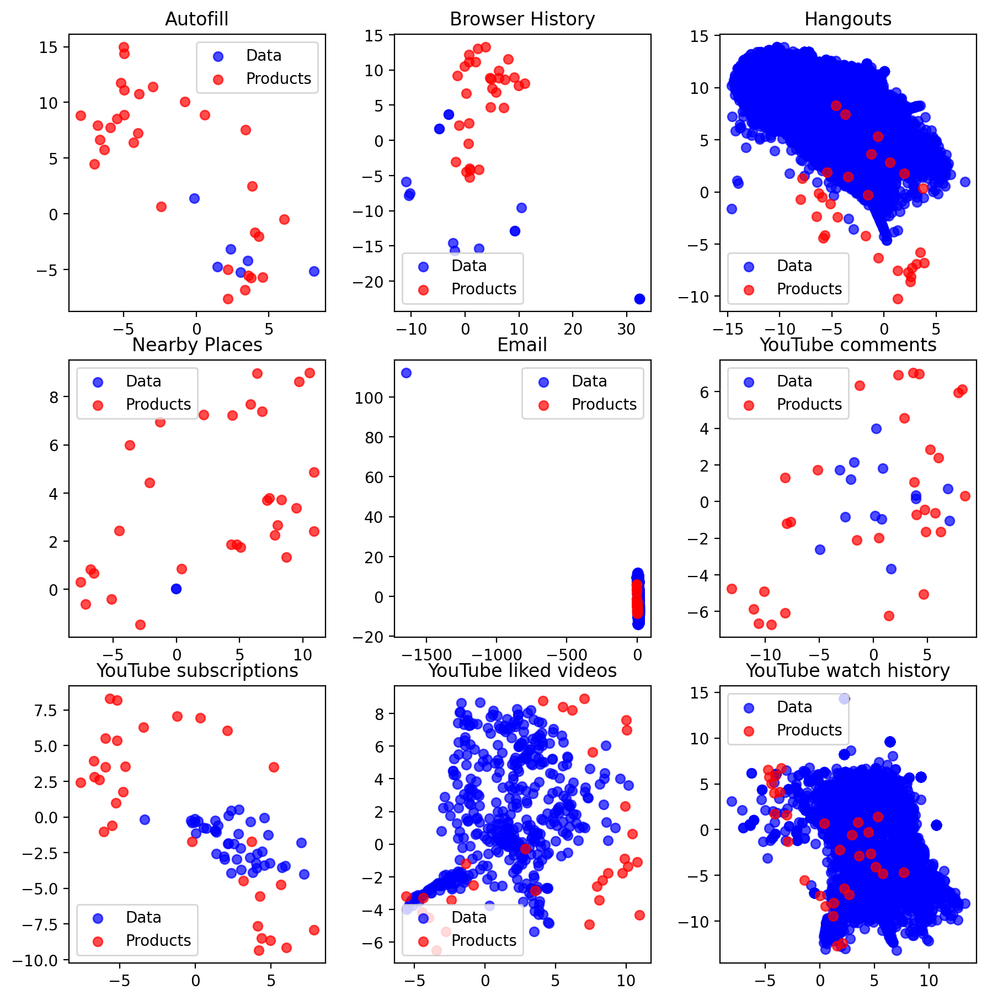

In [65]:
viz = EmbeddingVisualizer()
fig, ax = viz.visualize(*embeddings, titles=keys, reference=product_embeddings, figsize=(9,9), dpi=200)

## Topological visualization

In [7]:
from gtda.homology import VietorisRipsPersistence, EuclideanCechPersistence
from gtda.point_clouds import ConsistentRescaling

In [8]:
len(embeddings)

9

In [9]:
[x.shape for x in embeddings]

[(6, 768),
 (17, 768),
 (24105, 768),
 (2, 0),
 (26956, 768),
 (14, 768),
 (43, 768),
 (427, 768),
 (5778, 768)]

In [10]:
from IPython.display import SVG, display
from gtda.plotting import plot_diagram

In [11]:
vr = VietorisRipsPersistence()

In [34]:
x = embeddings[2]
x = x.reshape(1, *x.shape)
diagrams = vr.fit_transform_plot(x)

In [12]:
x = embeddings[4]
x = x.reshape(1, *x.shape)
diagrams = vr.fit_transform_plot(x)

In [36]:
x = embeddings[-1]
x = x.reshape(1, *x.shape)
diagrams = vr.fit_transform(x)    
vr.plot(diagrams);

In [37]:
plot_diagram(diagrams[0])